In [179]:
import os
import sys
from pathlib import Path

import anndata as ad
import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange
from matplotlib.patches import Patch

sc.settings.verbosity = 3

In [180]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [181]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import scanorama
import utils as my_utils

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [182]:
experiment = "Tonsil"
cores=['DonorA', 'DonorE']
datasets = [f'{core}_{i}' for core in cores for i in range(1,7)]

# Load data

In [183]:
import palettable
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap


In [184]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}_auto.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [185]:
adatas = []
df_sums = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    try:
        df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    except:
        pass
    df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
        df_morph["area"], axis=0
    )
    data_all = df_intensity_TS.iloc[:, 1:].values
    # data_all_norm = (data_all+0.1)/(np.percentile(data_all,50,axis=1,keepdims=True)+0.1)
    # data_all_norm = MinMaxScaler().fit_transform(data_all)
    # df_intensity_TS.iloc[:, 1:] = data_all_norm
    
    # Merge TS and IMC data
    df = df_intensity_TS
    df.set_index("Id", inplace=True)
    df_sums.append(df.sum(axis=0))
    
    # Put to adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    sc.pp.normalize_total(adata, target_sum=1e4)
    sc.pp.log1p(adata)
    sc.pp.scale(adata)
    adatas.append(adata)
adata = ad.concat(adatas, join="inner")

Sucessfully read dataset DonorA_1
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\AppData\Local\Temp/ipykernel_24632/1887427505.py:28: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset DonorA_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset DonorA_3
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset DonorA_4
normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset DonorA_5
normalizing counts per cell
    finished ({time_passed})
DonorA_6 cannot be read
Sucessfully read dataset DonorE_1
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset DonorE_2
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset DonorE_3
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset DonorE_4
normalizing counts per cell
    finished (0:00:00)
Sucessfully read dataset DonorE_5
normalizing counts per cell
    finished ({time_passed})
Sucessfully read dataset DonorE_6
normalizing counts per cell
    finished (0:00:00)


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [186]:
df_sum = pd.concat(df_sums, axis=1).mean(axis=1)
mz_qc = df_sum[(df_sum > 70000)].index.tolist()

In [187]:
len(mz_qc)

146

In [188]:
adata = adata[:, mz_qc]

## Get literature lut

In [189]:
SIMS_masses = adata.var_names

In [190]:
# Read litterature lut
file_path = data_dir / "metadata" / 'Putative_annotation_09012022.xlsx'
df = pd.read_excel(file_path)
lum = df['m/z'].to_numpy()

# get matched table by looking at difference with error
error = 0.4
matched_dfs = []
for mz in SIMS_masses.astype(float):
    if mz < 1.1:
        continue
    diff = lum-mz
    matched = df[abs(diff)<error]
    if len(matched) > 0:
        matched.loc[:,'SIMS mz'] = mz
        matched_dfs.append(matched)
    else:
        matched = pd.DataFrame([['', '', '', '', mz]], columns=df.columns.tolist() + ['SIMS mz'])
        matched_dfs.append(matched)
matched = pd.concat(matched_dfs)

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\pandas\core\indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value


In [191]:
# Get all info from litterature excel
SIMS_masses_subset = np.array(matched['SIMS mz'].to_list(), dtype=float).astype(str)
SIMS_masses_subset = pd.Index(SIMS_masses_subset)

SIMS_name_subset = np.array(matched['Molecules'].to_list()).astype(str)
SIMS_name_subset = pd.Index(SIMS_name_subset)

SIMS_nm_subset = SIMS_masses_subset + 'm/z ' + SIMS_name_subset

SIMS_type_subset = np.array(matched['Type'].to_list()).astype(str)
SIMS_type_subset = pd.Index(SIMS_type_subset)

print(f"Number of matched m/z: {len(SIMS_masses_subset)}")

Number of matched m/z: 145


In [192]:
adata_all = adata.copy()
adata = adata[:, SIMS_masses_subset]
adata.var_names = SIMS_nm_subset

In [318]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}_GC_CN.h5ad"
adata_CN = ad.read_h5ad(path)

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


# Compare per patient Inside GC

In [320]:
# Read Protein clustering info
path = data_dir / "adata" / f"{experiment}_GC.h5ad"
adata_IMC_all = ad.read_h5ad(path)

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [321]:
adata_IMC_all.obs['Region'] = adata_CN.obs.Region

In [322]:
adata_GC = adata_IMC_all[adata_IMC_all.obs.Region == 'GC']

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_Core']`


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\compat\_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


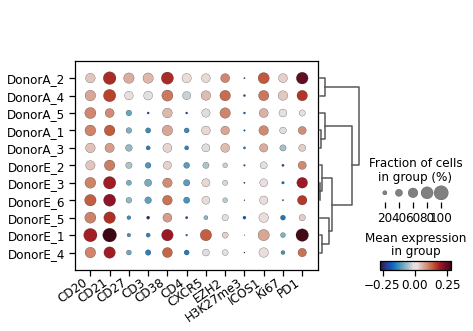

In [323]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata_GC, var_names=adata_GC.var_names, groupby='Core',
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

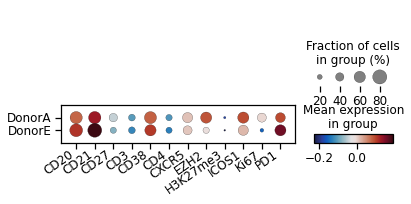

In [324]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata_GC, var_names=adata_GC.var_names, groupby='Dataset',
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [325]:
adata.obs["Type"] = adata_CN.obs["Type"]
adata.uns["Type_colors"] = adata_CN.uns["Type_colors"]
adata.obs["Region"] = adata_CN.obs["Region"]
adata.uns["Region_colors"] = adata_CN.uns["Region_colors"]
adata.obsm["spatial"] = adata_CN.obsm["spatial"]

In [326]:
adata_GC = adata[adata.obs.Region == 'GC']

In [327]:
var = 'Dataset'

# Make desired obs var column categorical
adata_GC.obs[var] = adata_GC.obs[var].astype('category')

# Get DE analysis
sc.tl.dendrogram(adata_GC, groupby=var)
sc.tl.rank_genes_groups(adata_GC, groupby=var, method='t-test_overestim_var')

# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata_GC, group=None)

# Get top diff expression
topk=4
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Dataset']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\Users\thu71\AppData\Local\Temp/ipykernel_24632/360385314.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_GC.obs[var] = adata_GC.obs[var].astype('category')
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


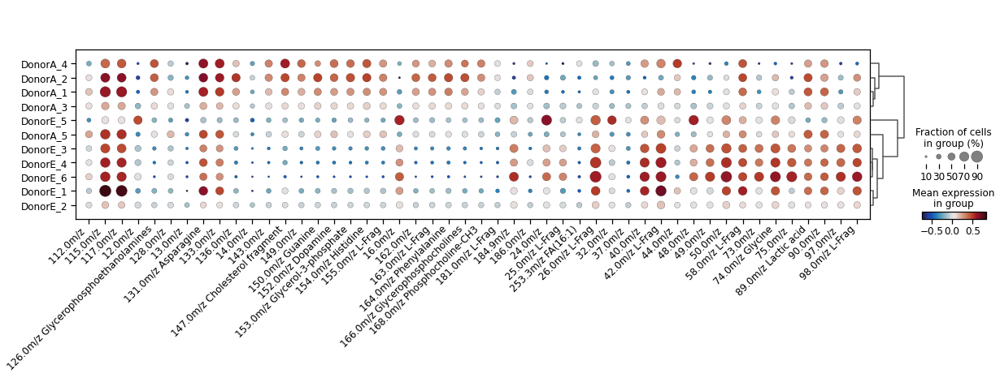

In [328]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata_GC, var_names=masses, groupby=var,
                    cmap=heatmap_cmp, dendrogram=True, show=False, expression_cutoff=0.3)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 45, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

# Compare per patient inside vs Outside GC

In [338]:
adata.obs['Dataset_region'] = adata.obs.agg('{0[Dataset]} {0[Region]}'.format, axis=1)

In [340]:
var = 'Dataset_region'

# Make desired obs var column categorical
adata.obs[var] = adata.obs[var].astype('category')

# Get DE analysis
sc.tl.dendrogram(adata, groupby=var)
sc.tl.rank_genes_groups(adata, groupby=var, method='t-test_overestim_var')

# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=4
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Dataset_region']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\tools\_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\tools\_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newf

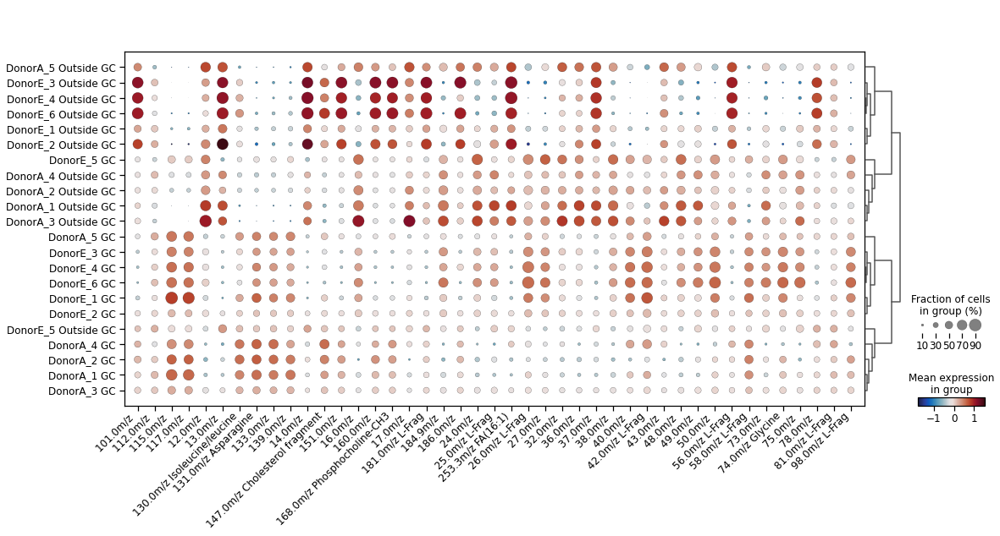

In [343]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata, var_names=masses, groupby=var,
                    cmap=heatmap_cmp, dendrogram=True, show=False, expression_cutoff=0.3)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 45, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

# FDC vs B cells vs TFH

## heatmap

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


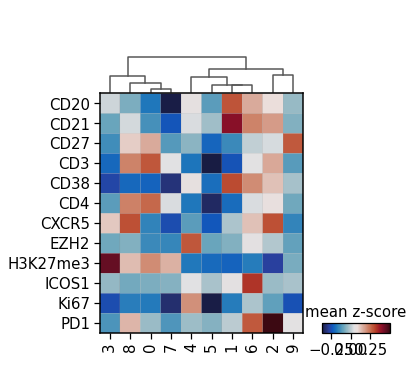

In [202]:
sc.tl.dendrogram(adata_IMC_all, groupby='leiden')

sns.set_context("notebook", font_scale=1.5)
sc.pl.matrixplot(
    adata_IMC_all,
    adata_IMC_all.var_names.tolist(),
    "leiden",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap=heatmap_cmp,
    swap_axes=True,
    # vmin=0,
    # vmax=0.3
)

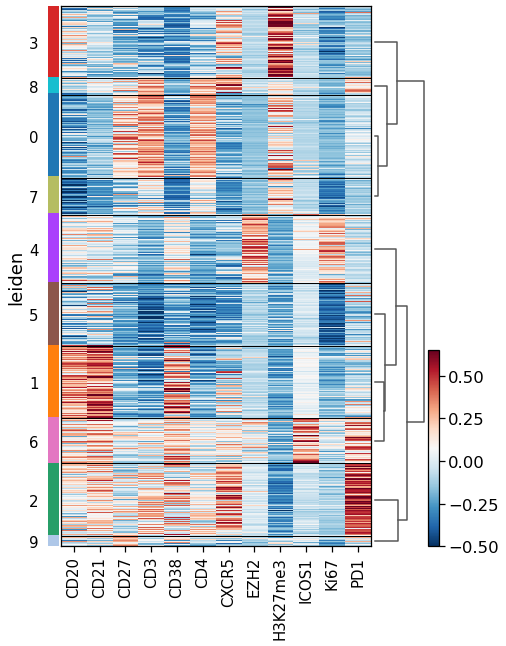

In [203]:
sc.pl.heatmap(
    adata_IMC_all,
    adata_IMC_all.var_names.tolist(),
    "leiden",
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
    vmin=-0.5,
    vmax=0.65
)

In [204]:
adata_IMC_all

AnnData object with n_obs × n_vars = 31156 × 12
    obs: 'Cell', 'Dataset', 'Core', 'leiden', 'Region'
    uns: 'Core_colors', 'Dataset_colors', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'neighbors', 'umap'
    obsm: 'X_scanorama', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

## Spatial projection

In [240]:
from typing import List
import matplotlib
import skimage
from skimage import measure


def get_masks(mask_folder, dataset):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name and dataset in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img


def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [246]:
experiment='tonsil'
masks = get_masks(data_dir / "masks", f"{experiment}")

In [248]:
colors = adata_IMC_all.uns["leiden_colors"]
labels = np.unique(adata_IMC_all.obs.leiden.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

DonorA_1


  0%|          | 0/5 [00:00<?, ?it/s]

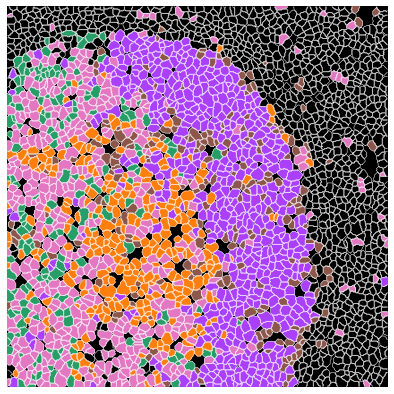

DonorA_2


  0%|          | 0/5 [00:00<?, ?it/s]

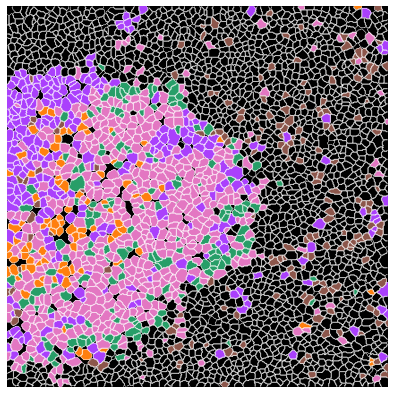

DonorA_3


  0%|          | 0/5 [00:00<?, ?it/s]

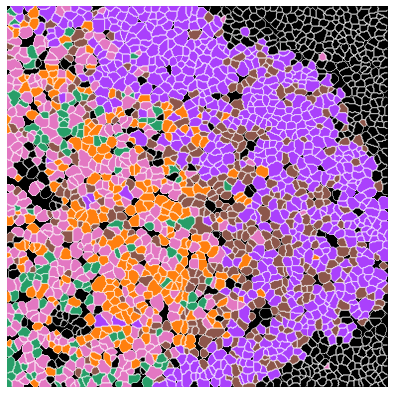

DonorA_4


  0%|          | 0/5 [00:00<?, ?it/s]

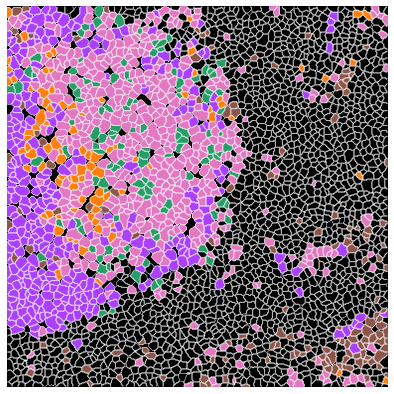

DonorA_5


  0%|          | 0/5 [00:00<?, ?it/s]

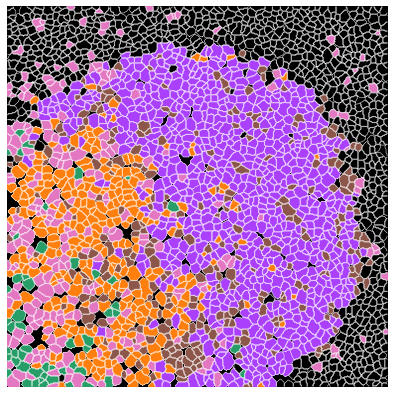

DonorA_6
DonorE_1


  0%|          | 0/5 [00:00<?, ?it/s]

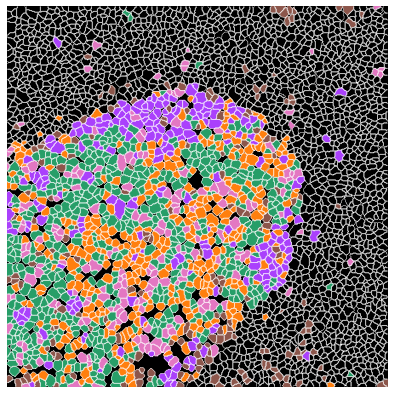

DonorE_2


  0%|          | 0/5 [00:00<?, ?it/s]

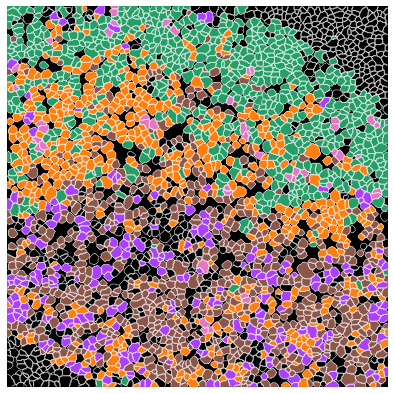

DonorE_3


  0%|          | 0/5 [00:00<?, ?it/s]

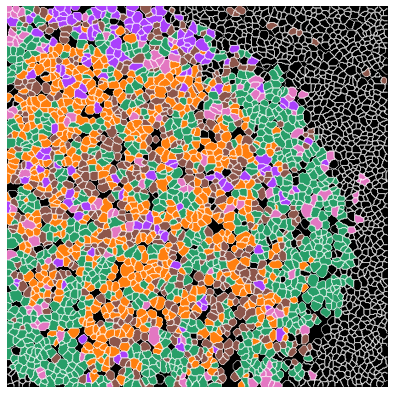

DonorE_4


  0%|          | 0/5 [00:00<?, ?it/s]

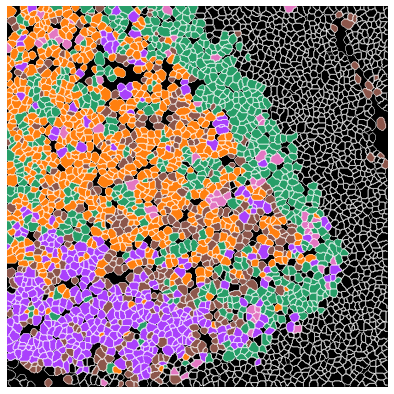

DonorE_5


  0%|          | 0/5 [00:00<?, ?it/s]

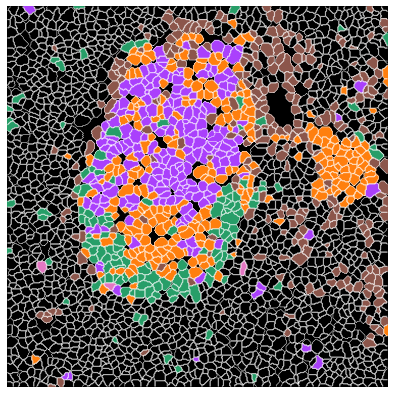

DonorE_6


  0%|          | 0/5 [00:00<?, ?it/s]

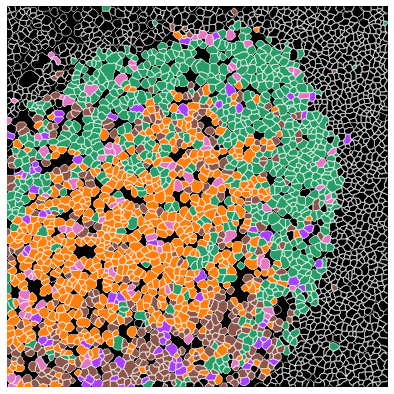

In [249]:
labels = ['6', '2', '1', '4', '5']

for dataset in datasets:
    print(dataset)
    adata_subset = adata_IMC_all[adata_IMC_all.obs.Core == dataset, :]
    try:
        mask = masks["_".join([experiment, dataset])]
        contours = get_contour(mask)
    except:
        continue

    # Get label2cell dict
    label2cell = {}
    for l in labels:
        cell_id = adata_subset[adata_subset.obs.leiden == l].obs.Cell.to_list()
        label2cell[l] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(7, 7))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()
    


## Rename cluster

In [209]:
type_dict = {'0': 'Other',
            '1': 'GC B-cell',
            '2': 'TFH', 
            '3': 'Other',
            '4': 'GC B-cell',
            '5': 'GC B-cell',
            '6': 'FDC',
            '7': 'Other',
            '8': 'Other',
            '9': 'Other',
            }

In [210]:
adata_IMC_all.obs['Region'] = (
    adata_IMC_all.obs['leiden']
    .map(type_dict)
    .astype("category")
)
adata_IMC_all.uns['Region_colors'] = adata_CN.uns['CN_colors'][:len(np.unique(adata_IMC_all.obs['Region']))]

In [211]:
adata.obs["Region"] = adata_IMC_all.obs["Region"]
adata.uns["Region_colors"] = adata_IMC_all.uns["Region_colors"]
adata.obsm["spatial"] = adata_IMC_all.obsm["spatial"]

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:00)
Storing dendrogram info using `.uns['dendrogram_Region']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


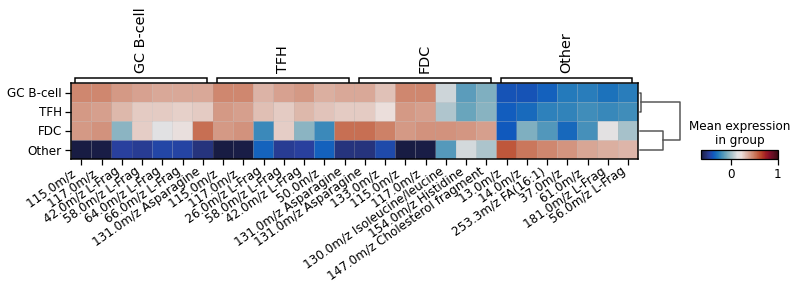

In [212]:
sc.tl.dendrogram(adata, groupby='Region')
sc.tl.rank_genes_groups(adata, groupby='Region', method='wilcoxon')
                        
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.rank_genes_groups_matrixplot(adata, n_genes=7, use_raw=False, cmap=heatmap_cmp, vmax=1, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [253]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata, group=None)

# Get top diff expression
topk=8
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

In [254]:
# Extract dataframe
var = 'Region'

adata_subset = adata[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

In [255]:
# Get subset of masses
adata_subset = adata[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))
df = df_SIMS_var[df_SIMS_var.Region == 'GC'].groupby('mz').mean()
df.sort_values('Normalized ion count', inplace=True)
masses_sorted = df.index.tolist()

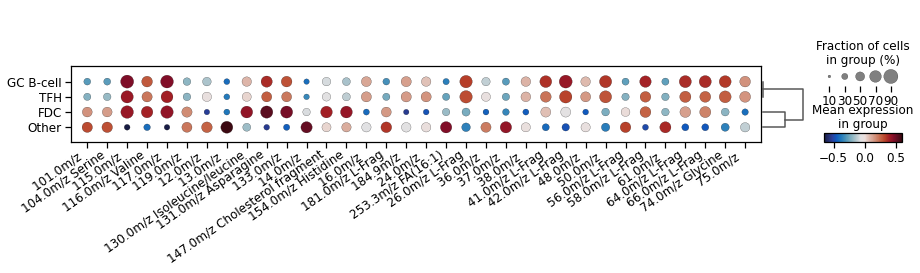

In [256]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata, var_names=masses, groupby='Region',
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [ ]:
adata_subset = adata

## Plot ims

In [267]:
h5_data_dir = p_dir / "data" / "h5"

def create_clustered_cell(mask, cell2count,  **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1]))*np.nan

    for cell, counts in tqdm(cell2count.items(), total=len(cell2count)):
        rows, cols = np.where(np.isin(mask, cell))
        img[rows, cols] = counts

    return img

def get_imgs_sims(experiment, name):
    with h5py.File(h5_data_dir / f"{experiment}.hdf5", "r") as f:
        imgs = f[name][:]
        labels = list(f[name].attrs["labels"])
    return imgs[2:], labels[2:]

def IMS(imgs, mz, masses):
    mz_img = imgs[np.equal(masses, mz),...][0]
    # fig, ax = plt.subplots(figsize=(7,7))
    # ax.imshow(mz_img, cmap=heatmap_cmp, interpolation='quadric', vmin=0,vmax=np.percentile(mz_img, 99))  
    # ax.axis('off')
    # plt.title(f'{mz} m/z')
    # plt.show()
    return mz_img 

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

  0%|          | 0/2711 [00:00<?, ?it/s]

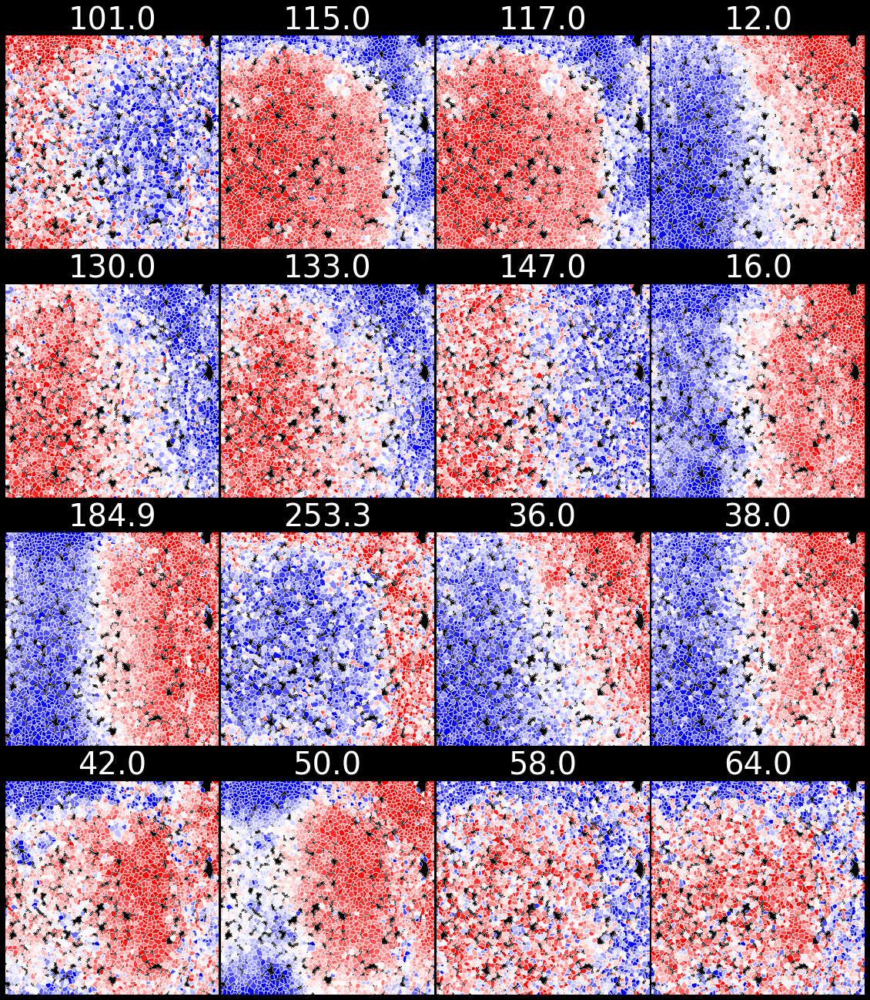

In [261]:
dataset = 'DonorA_1'

mask = masks[experiment + '_' + dataset]
contours = get_contour(mask)

adata_fov = adata[adata.obs['Dataset'] == dataset]

fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[::2][:16]):
    ax = axs[i]
    
    adata_subset = adata_fov[:, channel]
    # Get label2cell dict
    cells = adata_subset.obs['Cell'].to_list()
    counts = adata_subset.X.flatten()
    cell2count = dict(zip(cells, counts))

    img = create_clustered_cell(mask, cell2count)

    ax.imshow(img, cmap='bwr', vmin=np.nanpercentile(img, 5), vmax=np.nanpercentile(img, 95))
    ax.set_title(f"{channel.split('m/z')[0]}", size=40, c='w')
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.14)
plt.show()

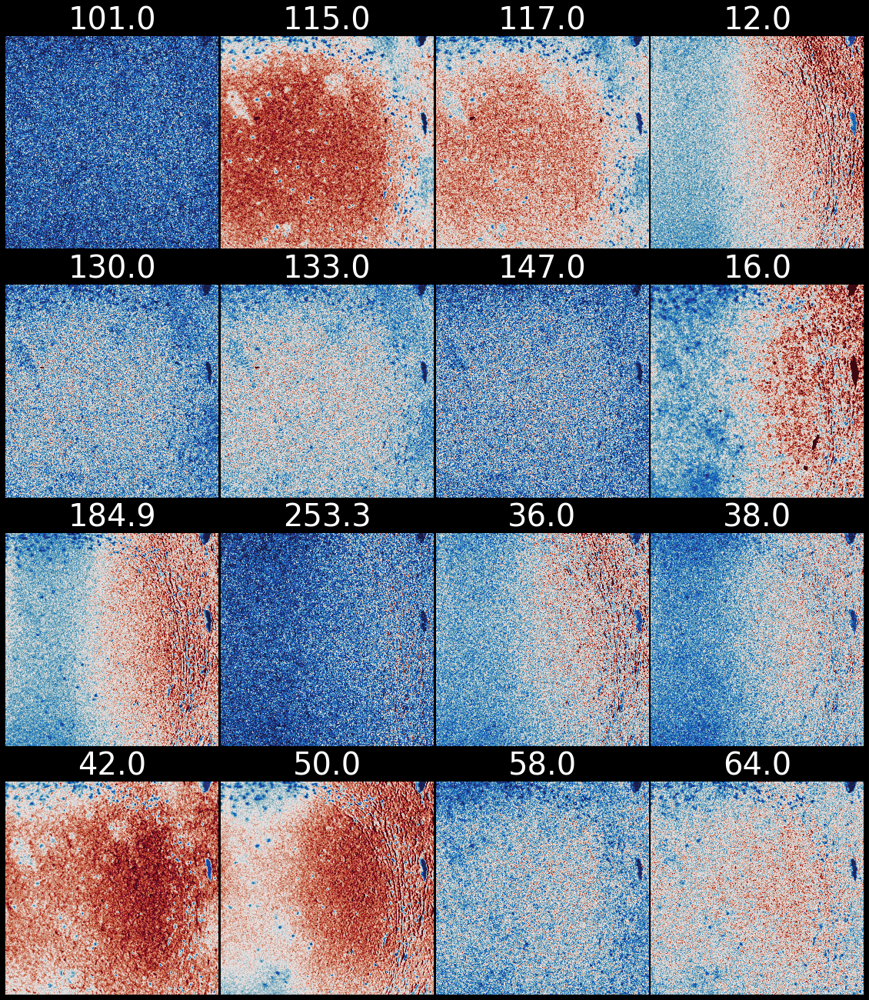

In [268]:
imgs, labels = get_imgs_sims(experiment, 'auto_'+dataset)
mzs = np.array(df_intensity_TS.columns.tolist()).astype(float)

fig, axs = plt.subplots(4,4,figsize=(20, 23), facecolor='k')
axs = axs.flatten()
for i, channel in enumerate(masses[::2][:16]):
    ax = axs[i]
    
    mz = float(channel.split('m/z')[0])
    mz_img = IMS(imgs, mz, mzs)
    
    ax.imshow(mz_img, cmap=heatmap_cmp, interpolation=None, vmin=0, vmax=np.percentile(mz_img, 95))
    ax.set_title(mz, size=40, c='w')
    ax.axis("off")
fig.subplots_adjust(wspace=0.01, hspace=0.15)
plt.show()


# Ki67 High vs normal

In [306]:
adata.obs["leiden"] = adata_IMC_all.obs["leiden"]

# Get B cell in GC region 
adata_bcell = adata[adata.obs['Region'] == 'GC B-cell'].copy()

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(


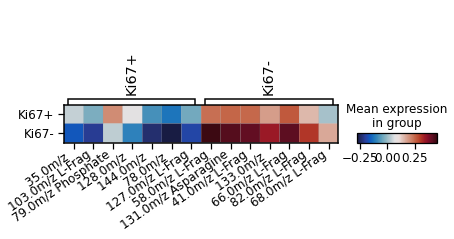

In [307]:
# Change cluster name to Ki67 expression
type_dict = {'5': 'Ki67-',
            '1': 'Ki67-',
            '4': 'Ki67+'
            }

adata_bcell.obs['leiden'] = (
    adata_bcell.obs['leiden']
    .map(type_dict)
    .astype("category")
)

# DE
sc.tl.dendrogram(adata_bcell, groupby='leiden')
sc.tl.rank_genes_groups(adata_bcell, groupby='leiden', method='t-test')
                        
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.rank_genes_groups_matrixplot(adata_bcell, n_genes=7, use_raw=False, cmap=heatmap_cmp, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

In [314]:
# Extract diff expression dataframe
dedf = sc.get.rank_genes_groups_df(adata_bcell, group=None)

# Get top diff expression
topk=15
masses_largest = dedf.groupby('group').apply(lambda x: x.nlargest(topk,['scores'])).names.unique()
masses_lowest = dedf.groupby('group').apply(lambda x: x.nsmallest(topk,['scores'])).names.unique()
masses = np.unique(np.concatenate([masses_largest, masses_lowest]))

In [315]:
# Extract dataframe
var = 'leiden'

adata_subset = adata_bcell[:,masses]
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

df_SIMS_grouped = df_SIMS.groupby([var]).mean()

In [316]:
# Get subset of masses
adata_subset = adata[:,masses]

# Get dataframe
df_SIMS = pd.DataFrame(adata_subset.X, columns=adata_subset.var_names)
df_SIMS[var] = adata_subset.obs[var].tolist()
# df_SIMS.drop(['1.0'], axis=1, inplace=True)

# Sort masses by GC eexpression
df_SIMS_var = (df_SIMS
                .melt(id_vars=var, var_name='mz', value_name='Normalized ion count'))
df = df_SIMS_var[df_SIMS_var.leiden == 'ki67+'].groupby('mz').mean()
df.sort_values('Normalized ion count', inplace=True)
masses_sorted = df.index.tolist()

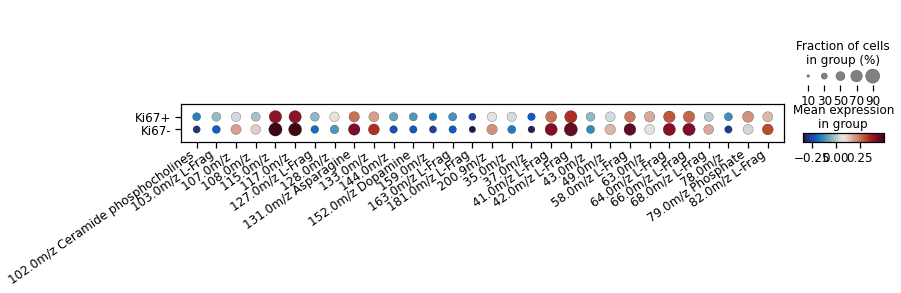

In [317]:
with sns.plotting_context('notebook', font_scale=1.2):
    ax = sc.pl.dotplot(adata_bcell, var_names=masses, groupby='leiden',
                    cmap=heatmap_cmp, dendrogram=True, show=False)
    xticklabels = ax['mainplot_ax'].get_xticklabels()
    ax['mainplot_ax'].set_xticklabels(xticklabels, rotation = 35, ha="right")
    ax['mainplot_ax'].tick_params(axis='x', pad=0)
    plt.show()

# Get cell neighbors

In [407]:
from sklearn.neighbors import NearestNeighbors
from kneed import KneeLocator
from sklearn.cluster import MiniBatchKMeans
from matplotlib.ticker import MaxNLocator
from skimage import morphology, measure, exposure
from scipy import ndimage


def get_NN(adata, n):
    data = adata.obsm["spatial"]
    # fit = NearestNeighbors(n_neighbors=n + 1).fit(data)
    fit = NearestNeighbors(n_neighbors=n).fit(data)
    m = fit.kneighbors(data)
    # m = m[0][:, 1:], m[1][:, 1:]
    m = m[0], m[1] # Distances, Indices

    # sort_neighbors
    args = m[0].argsort(axis=1)
    add = (
        np.arange(m[1].shape[0]) * m[1].shape[1]
    )  # arange for number of elements with step of number of neighbors
    sorted_indices = m[1].flatten()[
        args + add[:, None]
    ]  # Extract indices in sorted order
    return sorted_indices


def neighbor_frequency(adata, n, var='Region'):
    dummies = pd.get_dummies(adata.obs[var]).values
    cols = get_NN(adata, n)

    window = dummies[cols].flatten()
    window = window.reshape(-1, n, dummies.shape[1])
    window = window.sum(axis=1) / n
    assert len(window) == len(adata.X)
    return window

In [415]:
n_neighbors = 3
windows = []
var = 'leiden'

for d in adata_IMC_all.obs.Core.unique():
    adata_subset = adata_IMC_all[adata_IMC_all.obs.Core == d, :]

    # sq.gr.spatial_neighbors(adata_subset, n_neighs=n_neighbors)
    window = neighbor_frequency(adata_subset, n_neighbors, var=var)
    assert len(window) == len(adata_subset.X)

    windows.append(window)

windows = np.concatenate(windows)
windows.shape

(31156, 10)

In [416]:
adata_NN = ad.AnnData(windows)
adata_NN.raw = adata_IMC_all.copy()
adata_NN.obs = adata_IMC_all.obs.copy()
adata_NN.uns = adata_IMC_all.uns.copy()
adata_NN.obsm = adata_IMC_all.obsm.copy()
adata_NN.obsp = adata_IMC_all.obsp.copy() 
adata_NN.var_names = pd.get_dummies(adata_subset.obs[var]).columns.tolist()
adata_NN.obs['Cell Type'] = adata_IMC_all.obs[var]

C:\Users\thu71\AppData\Local\Temp/ipykernel_24632/2846007786.py:1: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_NN = ad.AnnData(windows)
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [417]:
adata_subset = adata_NN[adata_NN.obs['Cell Type']=='6']

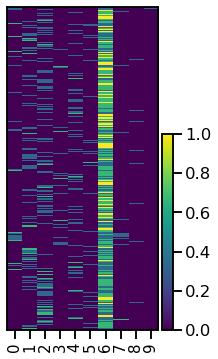

In [418]:
sc.pl.heatmap(adata_subset, adata_subset.var_names, groupby='Cell Type', use_raw=False)

In [420]:
df_nn = pd.DataFrame(windows, columns=pd.get_dummies(adata_subset.obs[var]).columns.tolist())
df_nn['Cell Type'] = adata_IMC_all.obs[var].tolist()


array([[0.33333333, 0.        , 0.        , ..., 0.        , 0.33333333,
        0.        ],
       [0.66666667, 0.        , 0.        , ..., 0.        , 0.33333333,
        0.        ],
       [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.33333333, 0.        , ..., 0.        , 0.        ,
        0.33333333],
       [0.33333333, 0.        , 0.        , ..., 0.33333333, 0.        ,
        0.        ],
       [0.33333333, 0.        , 0.        , ..., 0.66666667, 0.        ,
        0.        ]])